# __MACAD GRAPH MACHINE LEARNING__
***
### James Foo and Andres Roncal

This notebook explore the relationship between property development and eviction rates in Manhattan, NY.

#### IMPORT DEPENDENCIES

In [67]:
import networkx as nx
import osmnx as ox
import geopandas as gpd
import pandas as pd
import momepy as mp
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
# import nx_altair as nxa
import shapely.geometry as geom
from itertools import islice
from collections import Counter
import sklearn as sk
from sklearn.cluster import KMeans
from tqdm import tqdm
import torch
import dgl
import matplotlib.patches as mpatches
import torch.nn as nn
import torch.nn.functional as F
from dgl.nn import SAGEConv
from shapely.geometry import Point, box

### 1. CREATE GRAPH OF MANHATTAN WITH OSMNX
***

In [97]:
place_name = "Manhattan Island, New York, United States"
G = ox.graph_from_place(place_name, network_type= 'drive', simplify = True)

In [4]:
area = ox.geocode_to_gdf(place_name)

### 2. ADD FEATURES TO GRAPH
***

#### FEATURE 1: EVICTIONS

This data set contains all recorded evictions from the year 2017 to May of 2024. 

In [5]:
#Load eviction data and filter data for Manhattan only
eviction_data = open("./Data/Evictions_20240516.csv")
eviction_df = pd.read_csv(eviction_data)
manhattan_evictions = eviction_df[eviction_df['BOROUGH'] == 'MANHATTAN']
clean_evictions = manhattan_evictions.dropna(subset = ['Latitude'])

In [6]:
geometry = gpd.points_from_xy(clean_evictions['Longitude'], clean_evictions['Latitude'])
manhattan_evictions_gdf = gpd.GeoDataFrame(clean_evictions, geometry= geometry)
manhattan_evictions_gdf.set_crs(epsg= 4326)

,Court Index Number,Docket Number,Eviction Address,Eviction Apartment Number,Executed Date,Marshal First Name,Marshal Last Name,Residential/Commercial,BOROUGH,Eviction Postcode,...,Eviction/Legal Possession,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,geometry
3,74670/16,61667,535 WEST 110TH STREE T,3A,05/04/2017,Justin,Grossman,Residential,MANHATTAN,10025,...,Possession,40.803795,-73.965797,9.0,7.0,199.0,1056904.0,1.018820e+09,Morningside Heights,POINT (-73.96580 40.80380)
10,311118/22,6085,2915 FREDERICK DOUGLASS BLVD,4C,03/05/2024,David,Smith,Residential,MANHATTAN,10039,...,Possession,40.828736,-73.937611,10.0,9.0,23502.0,1060897.0,1.020470e+09,Central Harlem North-Polo Grounds,POINT (-73.93761 40.82874)
14,59878/19,18419,620 WEST 172ND STREE T,4A,08/13/2019,George,"Essock, Jr.",Residential,MANHATTAN,10032,...,Possession,40.844060,-73.939327,12.0,10.0,253.0,1063486.0,1.021420e+09,Washington Heights South,POINT (-73.93933 40.84406)
36,82266/16,9013,220 CABRINI BLVD,3D,01/30/2018,George,"Essock, Jr.",Residential,MANHATTAN,10033,...,Possession,40.854901,-73.938490,12.0,10.0,275.0,1064369.0,1.021790e+09,Washington Heights North,POINT (-73.93849 40.85490)
39,N60311/19,97948,267 WEST 146TH STREE T,16,10/03/2019,Ileana,Rivera,Residential,MANHATTAN,10039,...,Possession,40.823075,-73.940380,10.0,9.0,234.0,1060499.0,1.020320e+09,Central Harlem North-Polo Grounds,POINT (-73.94038 40.82308)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91169,21087/18,34034,442 EAST 105TH ST,05B,05/07/2019,Bruce,Kemp,Residential,MANHATTAN,10029,...,Eviction,40.788265,-73.938952,11.0,8.0,162.0,1083950.0,1.016960e+09,East Harlem South,POINT (-73.93895 40.78827)
91195,080658/17,80051,106-108 WEST 109TH ST,3C,03/02/2018,Henry,Daley,Residential,MANHATTAN,10025,...,Possession,40.801398,-73.962010,7.0,7.0,193.0,1056007.0,1.018630e+09,Morningside Heights,POINT (-73.96201 40.80140)
91196,65769/19,357421,243 EAST 83RD STREET,5C,12/12/2019,Thomas,Bia,Residential,MANHATTAN,10028,...,Possession,40.776451,-73.954395,8.0,5.0,138.0,1048703.0,1.015290e+09,Yorkville,POINT (-73.95440 40.77645)
91197,65769/19,357421,243 EAST 83RD STREET,5C,12/12/2019,Thomas,Bia,Residential,MANHATTAN,10028,...,Possession,40.776451,-73.954395,8.0,5.0,138.0,1048703.0,1.015290e+09,Yorkville,POINT (-73.95440 40.77645)


In [7]:
eviction_gdf_points = manhattan_evictions_gdf[manhattan_evictions_gdf['geometry'].type == 'Point']
eviction_gdf_points.head()

,Court Index Number,Docket Number,Eviction Address,Eviction Apartment Number,Executed Date,Marshal First Name,Marshal Last Name,Residential/Commercial,BOROUGH,Eviction Postcode,...,Eviction/Legal Possession,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,geometry
3,74670/16,61667,535 WEST 110TH STREE T,3A,05/04/2017,Justin,Grossman,Residential,MANHATTAN,10025,...,Possession,40.803795,-73.965797,9.0,7.0,199.0,1056904.0,1.018820e+09,Morningside Heights,POINT (-73.96580 40.80380)
10,311118/22,6085,2915 FREDERICK DOUGLASS BLVD,4C,03/05/2024,David,Smith,Residential,MANHATTAN,10039,...,Possession,40.828736,-73.937611,10.0,9.0,23502.0,1060897.0,1.020470e+09,Central Harlem North-Polo Grounds,POINT (-73.93761 40.82874)
14,59878/19,18419,620 WEST 172ND STREE T,4A,08/13/2019,George,"Essock, Jr.",Residential,MANHATTAN,10032,...,Possession,40.844060,-73.939327,12.0,10.0,253.0,1063486.0,1.021420e+09,Washington Heights South,POINT (-73.93933 40.84406)
36,82266/16,9013,220 CABRINI BLVD,3D,01/30/2018,George,"Essock, Jr.",Residential,MANHATTAN,10033,...,Possession,40.854901,-73.938490,12.0,10.0,275.0,1064369.0,1.021790e+09,Washington Heights North,POINT (-73.93849 40.85490)
39,N60311/19,97948,267 WEST 146TH STREE T,16,10/03/2019,Ileana,Rivera,Residential,MANHATTAN,10039,...,Possession,40.823075,-73.940380,10.0,9.0,234.0,1060499.0,1.020320e+09,Central Harlem North-Polo Grounds,POINT (-73.94038 40.82308)


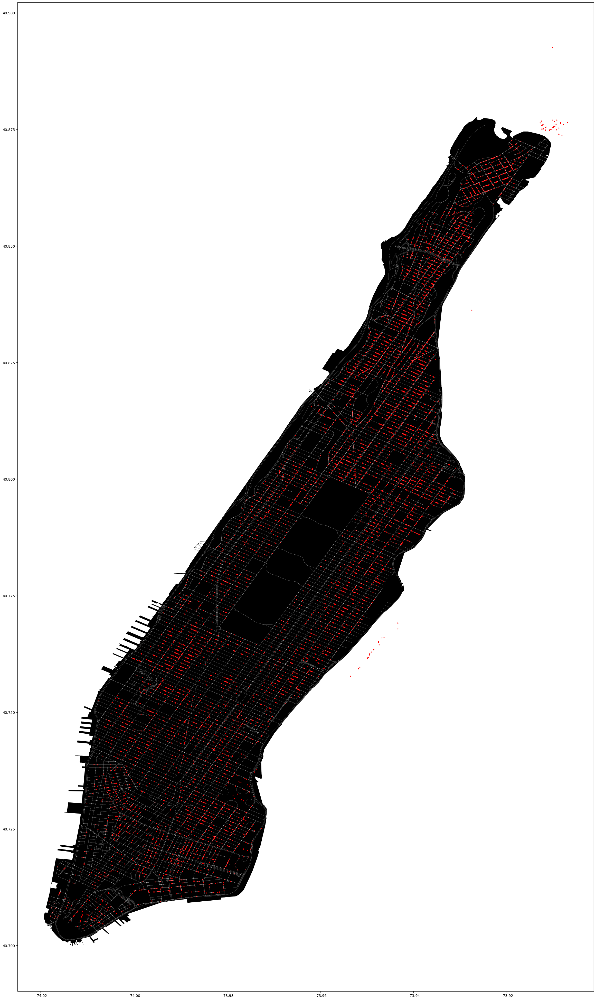

In [8]:
nodes, edges = ox.graph_to_gdfs(G)
fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'white', facecolor = 'black')
nodes.plot(ax= ax, color = 'white', markersize = .1)
eviction_gdf_points.plot(ax= ax, markersize = 3, color = 'red')

plt.show()

##### Option A: Assign Edges
Assign values to their closest edge and assign the edge the total number of evictions associated with it.

In [9]:
#Count number of evicictions for each edge
close_edges = ox.distance.nearest_edges(G, eviction_gdf_points['geometry'].x, eviction_gdf_points['geometry'].y)
eviction_count = Counter(close_edges)
evictions = []

#Assign value to each edge
for i in edges.index:
    eviction = eviction_count[edges.loc[i].name]
    evictions.append(eviction)

max(evictions)
edges['evictions'] = evictions

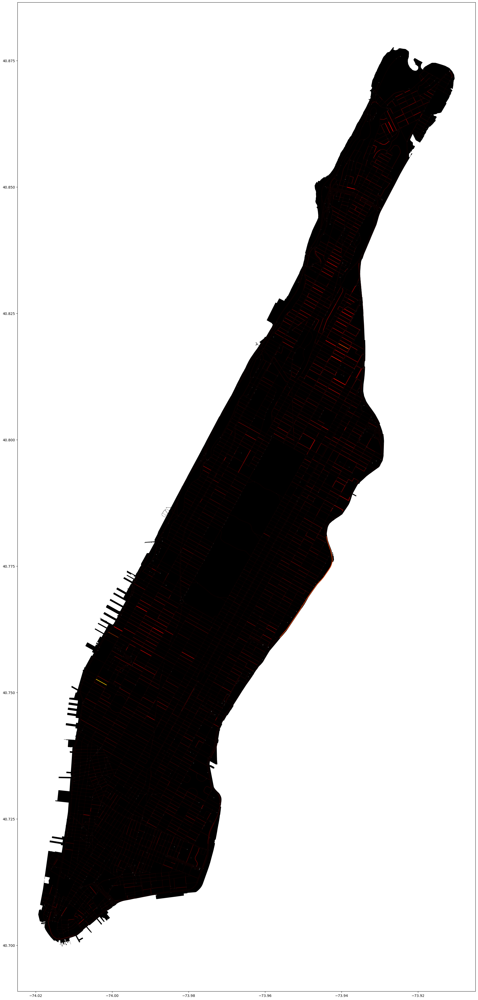

In [10]:
fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, column = 'evictions', cmap = 'hot', linewidth = 1.5)
nodes.plot(ax= ax, color = 'white', markersize = .1)
# property_gdf.plot(ax= ax,  markersize = 0.5, color = 'blue')

plt.show()

##### Option B: Assign to Nodes

In [65]:
def place_boxes(points, width):
    return (gpd.GeoSeries([box(minx= p.x - width/2 , miny = p.y - width /2, maxx = p.x + width/2, maxy = p.y + width/2) for p in points]))

In [78]:
eviction_boxes = place_boxes(eviction_gdf_points['geometry'], .003)

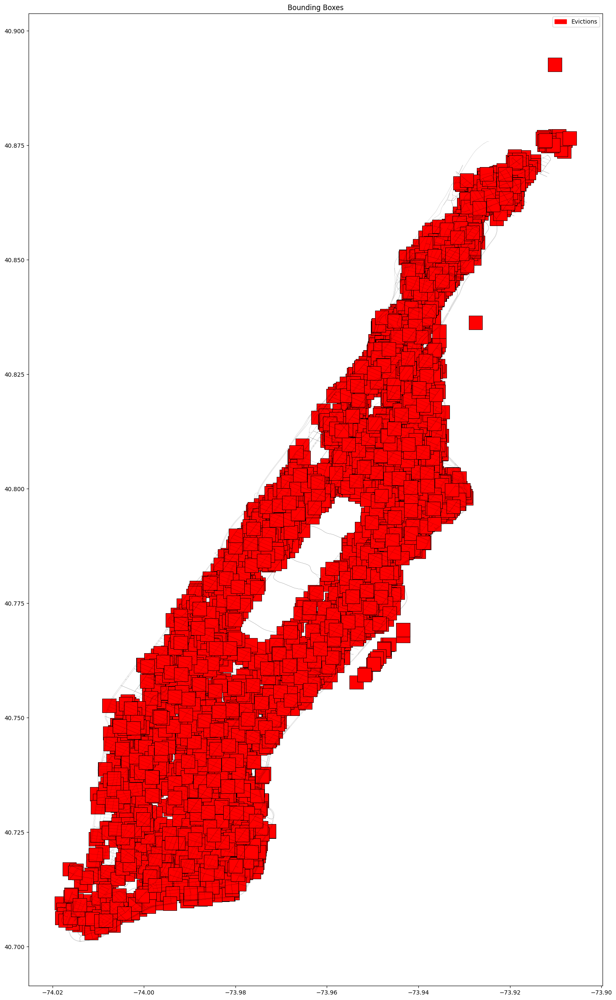

In [79]:
fig, ax = plt.subplots(figsize=(30,30))
#boundary.plot(ax=ax, facecolor='gray')
edges.plot(ax=ax, linewidth=0.1, edgecolor='black')
nodes.plot(ax=ax, color='black', markersize=0.0003)

eviction_boxes.plot(ax=ax,facecolor='red',color="red", markersize=5, edgecolor="black", linewidth=0.6)

#create a legend
eviction_patch = mpatches.Patch(color='red', label='Evictions')

plt.legend(handles=[eviction_patch] )
ax.set_title("Bounding Boxes")
plt.show()

In [ ]:
node_points =  gpd.GeoSeries(gpd.points_from_xy(list(nodes['x']), list(nodes['y'])))
print(node_points)

In [82]:
nodes_osmid=list(nodes.index)
Points_spatialindex=list(node_points.index) 

osmId_spatialIndex = {}
[osmId_spatialIndex.update({i:j}) for i,j in zip(Points_spatialindex ,nodes_osmid)]
len(nodes_osmid)

4504

In [83]:
nearest_points_spatial_index_evictions =nodes.sindex.query(eviction_boxes)

#### FEATURE 2: PROPERTY VALUE

In [11]:
property_df = pd.read_csv('./Data/cleaned_property_data.zip')


c:\Users\jfoo\AppData\Local\miniconda3\envs\graphml\lib\site-packages\IPython\core\interactiveshell.py:3508: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [12]:
geometry = gpd.points_from_xy(property_df['Longitude'], property_df['Latitude'])
property_gdf = gpd.GeoDataFrame(property_df, geometry= geometry)
property_gdf.set_crs(epsg= 4326)

,Unnamed: 0,Unnamed: 0.1,BBLE,BORO,BLOCK,LOT,BLDGCL,TAXCLASS,LTFRONT,LTDEPTH,...,Borough,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,NTA,New Georeferenced Column,geometry
0,0,3514,1009281654,1,928,1654,R4,2,0,0,...,MANHATTAN,40.736451,-73.978732,106.0,2.0,64.0,1086124.0,Gramercy,POINT (-73.978732 40.736451),POINT (-73.97873 40.73645)
1,1,3519,1009281661,1,928,1661,R4,2,0,0,...,MANHATTAN,40.736451,-73.978732,106.0,2.0,64.0,1086124.0,Gramercy,POINT (-73.978732 40.736451),POINT (-73.97873 40.73645)
2,2,3544,1010511417,1,1051,1417,R4,2,0,0,...,MANHATTAN,40.759212,-73.994510,104.0,3.0,115.0,1088437.0,Clinton,POINT (-73.99451 40.759212),POINT (-73.99451 40.75921)
3,3,7066,1006371201,1,637,1201,R8,2C,0,0,...,MANHATTAN,40.735330,-74.009670,102.0,3.0,75.0,1012003.0,West Village,POINT (-74.00967 40.73533),POINT (-74.00967 40.73533)
4,4,10598,1002791006,1,279,1006,R1,2C,0,0,...,MANHATTAN,40.712189,-73.997843,103.0,1.0,27.0,1003389.0,Chinatown,POINT (-73.997843 40.712189),POINT (-73.99784 40.71219)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1341054,1341054,8925107,1019480024,1,1948,24,G7,4,25,100,...,MANHATTAN,40.807889,-73.953676,110.0,9.0,257.0,1000000.0,Central Harlem South,POINT (-73.953676 40.807889),POINT (-73.95368 40.80789)
1341055,1341055,8925108,1021440003,1,2144,3,I9,4,50,100,...,MANHATTAN,40.846186,-73.937623,112.0,10.0,263.0,1089928.0,Washington Heights South,POINT (-73.937623 40.846186),POINT (-73.93762 40.84619)
1341056,1341056,8925110,1021410029,1,2141,29,D7,2,139,95,...,MANHATTAN,40.843846,-73.938775,112.0,10.0,253.0,1063463.0,Washington Heights South,POINT (-73.938775 40.843846),POINT (-73.93878 40.84385)
1341057,1341057,8925111,1020251006,1,2025,1006,R2,2,72,100,...,MANHATTAN,40.818687,-73.941926,110.0,9.0,230.0,1060373.0,Central Harlem North-Polo Grounds,POINT (-73.941926 40.818687),POINT (-73.94193 40.81869)


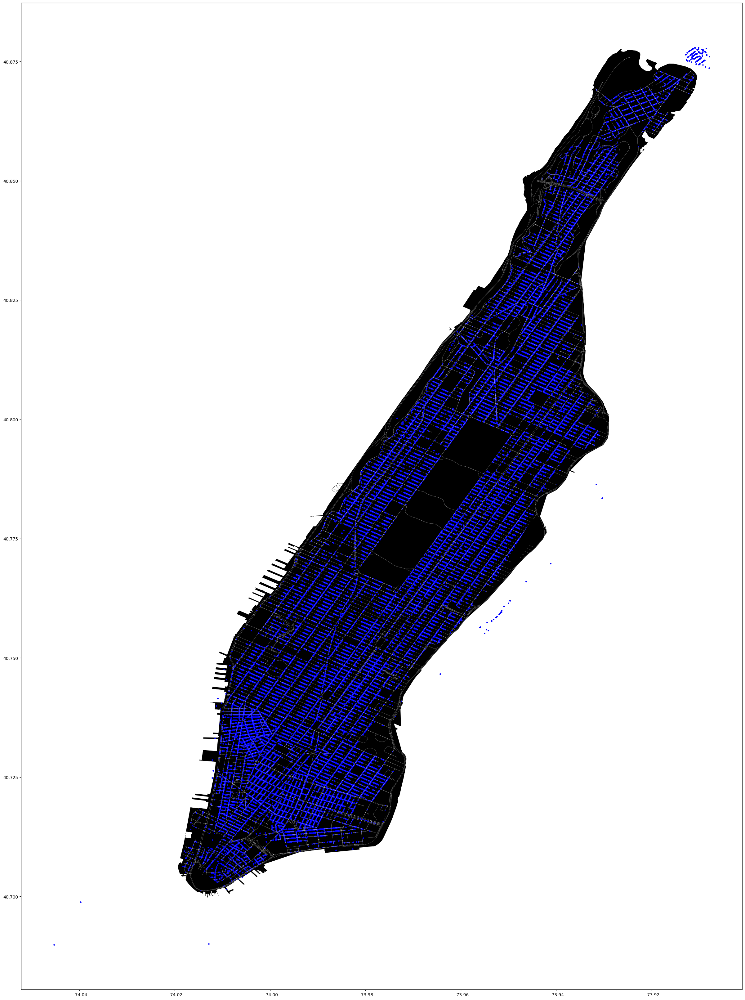

In [13]:
property_gdf_points = property_gdf[property_gdf['geometry'].type == 'Point']

fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'white', facecolor = 'black')
nodes.plot(ax= ax, color = 'white', markersize = .1)
property_gdf_points.plot(ax= ax, markersize = 3, color = 'blue')

plt.show()

In [14]:
nearest_edges = ox.distance.nearest_edges(G, property_gdf['geometry'].x, property_gdf['geometry'].y)
edge_values = {edge: [] for edge in nearest_edges}

In [15]:
for i, edge in enumerate(nearest_edges):
    edge_values[edge].append(property_gdf.iloc[i]['AVTOT'])

In [16]:
# print(list(islice(edge_values.items(), 1)))

In [17]:
for edge, values in edge_values.items():
    avg_value = np.mean(values)
    print(avg_value)
    u, v, key = edge
    edges.loc[(u,v,key), 'Average Value'] = avg_value

edges = edges.fillna(0)

548511.1117647059
834887.9142857143
132138.68347338936
189441.25490196078
749317.5384615385
389836.35931558936
145630.38522012578
475267.89858490566
112886.8525648415
153280.16358641358
125159.3289657095
475653.9603960396
618225.2037037037
202416.28265107214
24901257.583333332
202694.46506024097
975239.3174603175
125546.21519795658
204391.97695218437
1278060.139497595
206469.70316693504
223284.76388888888
533026.873385013
147525.67336860672
452317.6759259259
227260.78289962825
244508.08408796895
117517.71028806585
72748.09315375982
289822.0189393939
282185.5181008902
124199.94962686567
343875.8888888889
249204.59081836327
780495.7654320988
131325.01880341882
222880.4513847967
119668.31573157315
807219.1560102302
684699.9569789675
223670.6888888889
98132.30202020203
807617.117820324
626092.1811175337
2713570.0
174234.10014947684
2436052.2027027025
222172.90571049138
173940.99881446356
95556.8499756454
229644.43901035673
700492.344262295
442216.5664451827
317047.09882352944
1881624.57885

In [18]:
from sklearn.preprocessing import StandardScaler
value_scaler = StandardScaler()

edges['Scaled Value'] = value_scaler.fit_transform(np.array(edges['Average Value']).reshape(-1,1))

(array([9.014e+03, 3.320e+02, 1.360e+02, 6.000e+01, 3.900e+01, 2.400e+01,
        2.000e+01, 1.500e+01, 1.600e+01, 1.200e+01, 4.000e+00, 3.000e+00,
        5.000e+00, 5.000e+00, 4.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 4.000e+00, 2.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

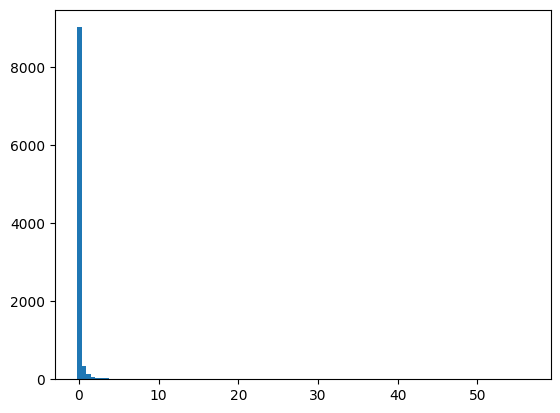

In [19]:
plt.hist(edges['Scaled Value'], bins=100)

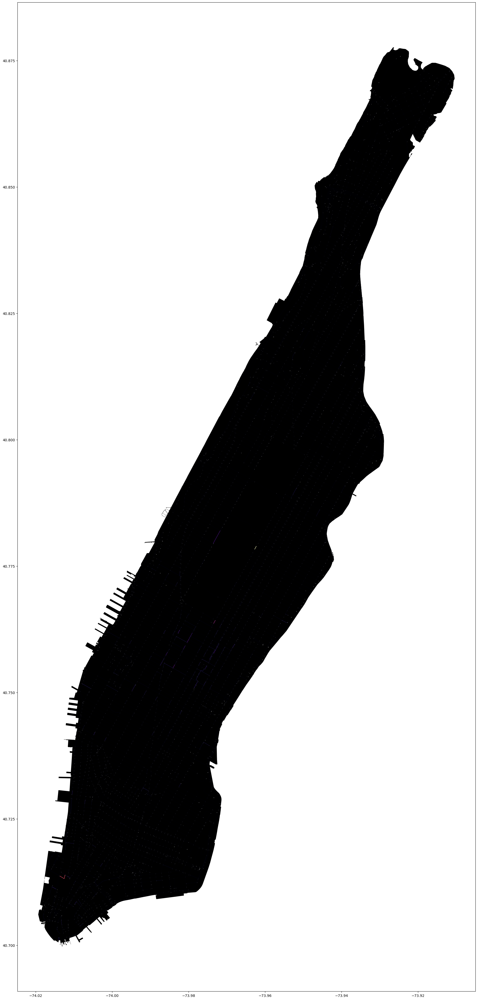

In [20]:
fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, column = 'Scaled Value', cmap = 'magma', linewidth = 1)
nodes.plot(ax= ax, color = 'white', markersize = .1)
# property_gdf.plot(ax= ax,  markersize = 0.5, color = 'blue')

plt.show()

#### FEATURE 3: HOUSING PROJECTS SINCE 2010

In [21]:
construction_data = open('./Data/HousingDB_post2010.csv')
construction_df = pd.read_csv(construction_data)
manhattan_construction = construction_df[construction_df['Boro']==1]
clean_construction = manhattan_construction.dropna(subset = ['Latitude'])
clean_construction.head()

c:\Users\jfoo\AppData\Local\miniconda3\envs\graphml\lib\site-packages\IPython\core\interactiveshell.py:3508: DtypeWarning: Columns (0,21,28,29,30,36) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Job_Number,Job_Type,ResidFlag,NonresFlag,Job_Status,CompltYear,PermitYear,ClassAInit,ClassAProp,ClassANet,...,FireBattln,FireDivsn,PolicePcnt,PL_FIRM07,PL_PFIRM15,Latitude,Longitude,GeomSource,DCPEdited,Version
0,102133451,Alteration,Residential,NaN,3. Permitted for Construction,NaN,2003.0,8,8,0,...,1.0,1.0,1.0,NaN,NaN,40.719845,-74.009588,BIN DOB buildingfootprints,otherb_init/hotel_init/hotel_prop/otherb_prop/...,23Q4
1,102138820,Alteration,Residential,NaN,5. Completed Construction,2012.0,2008.0,6,19,13,...,11.0,3.0,24.0,NaN,NaN,40.796741,-73.962554,BIN DOB buildingfootprints,otherb_init/hotel_prop/otherb_prop/hotel_init/...,23Q4
2,102151083,Alteration,Residential,NaN,5. Completed Construction,2011.0,2002.0,7,9,2,...,4.0,1.0,9.0,NaN,NaN,40.722545,-73.982291,BIN DOB buildingfootprints,NaN,23Q4
3,102284172,Alteration,Residential,Non-Residential,5. Completed Construction,2016.0,2001.0,1,1,0,...,6.0,1.0,9.0,NaN,NaN,40.726385,-73.992369,BIN DOB buildingfootprints,classa_init,23Q4
4,102284804,Alteration,Residential,NaN,5. Completed Construction,2022.0,2001.0,4,4,0,...,6.0,1.0,6.0,NaN,NaN,40.728763,-74.000817,BIN DOB buildingfootprints,hotel_prop/hotel_init/classa_init/otherb_init/...,23Q4


In [22]:
construction_geometry = gpd.points_from_xy(clean_construction['Longitude'], clean_construction['Latitude'])
construction_gdf = gpd.GeoDataFrame(clean_construction, geometry = construction_geometry)
construction_gdf.set_crs(epsg = 4326)
# new_construction = construction_gdf[construction_gdf['Job_Type'] == 'New Building']

,Job_Number,Job_Type,ResidFlag,NonresFlag,Job_Status,CompltYear,PermitYear,ClassAInit,ClassAProp,ClassANet,...,FireDivsn,PolicePcnt,PL_FIRM07,PL_PFIRM15,Latitude,Longitude,GeomSource,DCPEdited,Version,geometry
0,102133451,Alteration,Residential,NaN,3. Permitted for Construction,NaN,2003.0,8,8,0,...,1.0,1.0,NaN,NaN,40.719845,-74.009588,BIN DOB buildingfootprints,otherb_init/hotel_init/hotel_prop/otherb_prop/...,23Q4,POINT (-74.00959 40.71984)
1,102138820,Alteration,Residential,NaN,5. Completed Construction,2012.0,2008.0,6,19,13,...,3.0,24.0,NaN,NaN,40.796741,-73.962554,BIN DOB buildingfootprints,otherb_init/hotel_prop/otherb_prop/hotel_init/...,23Q4,POINT (-73.96255 40.79674)
2,102151083,Alteration,Residential,NaN,5. Completed Construction,2011.0,2002.0,7,9,2,...,1.0,9.0,NaN,NaN,40.722545,-73.982291,BIN DOB buildingfootprints,NaN,23Q4,POINT (-73.98229 40.72254)
3,102284172,Alteration,Residential,Non-Residential,5. Completed Construction,2016.0,2001.0,1,1,0,...,1.0,9.0,NaN,NaN,40.726385,-73.992369,BIN DOB buildingfootprints,classa_init,23Q4,POINT (-73.99237 40.72639)
4,102284804,Alteration,Residential,NaN,5. Completed Construction,2022.0,2001.0,4,4,0,...,1.0,6.0,NaN,NaN,40.728763,-74.000817,BIN DOB buildingfootprints,hotel_prop/hotel_init/classa_init/otherb_init/...,23Q4,POINT (-74.00082 40.72876)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69351,M08055337,Alteration,Residential,Non-Residential,2. Approved Application,NaN,NaN,2,2,0,...,1.0,9.0,NaN,NaN,40.727461,-73.990142,BIN DOB buildingfootprints,NaN,23Q4,POINT (-73.99014 40.72746)
69352,M08055390,Alteration,Residential,NaN,1. Filed Application,NaN,NaN,6,6,0,...,3.0,28.0,NaN,NaN,40.804428,-73.948899,BIN DOB buildingfootprints,NaN,23Q4,POINT (-73.94890 40.80443)
69353,M08055506,Alteration,Residential,NaN,3. Permitted for Construction,NaN,2023.0,1,1,0,...,3.0,24.0,NaN,NaN,40.790582,-73.978352,BIN DOB buildingfootprints,NaN,23Q4,POINT (-73.97835 40.79058)
74632,X00633905,New Building,Residential,Non-Residential,2. Approved Application,NaN,NaN,0,115,115,...,7.0,50.0,NaN,NaN,40.875608,-73.913097,Lat/Lon geosupport,NaN,23Q4,POINT (-73.91310 40.87561)


In [23]:
construction_points = construction_gdf[construction_gdf['geometry'].type == 'Point']
construction_points.head()

,Job_Number,Job_Type,ResidFlag,NonresFlag,Job_Status,CompltYear,PermitYear,ClassAInit,ClassAProp,ClassANet,...,FireDivsn,PolicePcnt,PL_FIRM07,PL_PFIRM15,Latitude,Longitude,GeomSource,DCPEdited,Version,geometry
0,102133451,Alteration,Residential,NaN,3. Permitted for Construction,NaN,2003.0,8,8,0,...,1.0,1.0,NaN,NaN,40.719845,-74.009588,BIN DOB buildingfootprints,otherb_init/hotel_init/hotel_prop/otherb_prop/...,23Q4,POINT (-74.00959 40.71984)
1,102138820,Alteration,Residential,NaN,5. Completed Construction,2012.0,2008.0,6,19,13,...,3.0,24.0,NaN,NaN,40.796741,-73.962554,BIN DOB buildingfootprints,otherb_init/hotel_prop/otherb_prop/hotel_init/...,23Q4,POINT (-73.96255 40.79674)
2,102151083,Alteration,Residential,NaN,5. Completed Construction,2011.0,2002.0,7,9,2,...,1.0,9.0,NaN,NaN,40.722545,-73.982291,BIN DOB buildingfootprints,NaN,23Q4,POINT (-73.98229 40.72254)
3,102284172,Alteration,Residential,Non-Residential,5. Completed Construction,2016.0,2001.0,1,1,0,...,1.0,9.0,NaN,NaN,40.726385,-73.992369,BIN DOB buildingfootprints,classa_init,23Q4,POINT (-73.99237 40.72639)
4,102284804,Alteration,Residential,NaN,5. Completed Construction,2022.0,2001.0,4,4,0,...,1.0,6.0,NaN,NaN,40.728763,-74.000817,BIN DOB buildingfootprints,hotel_prop/hotel_init/classa_init/otherb_init/...,23Q4,POINT (-74.00082 40.72876)


<Axes: >

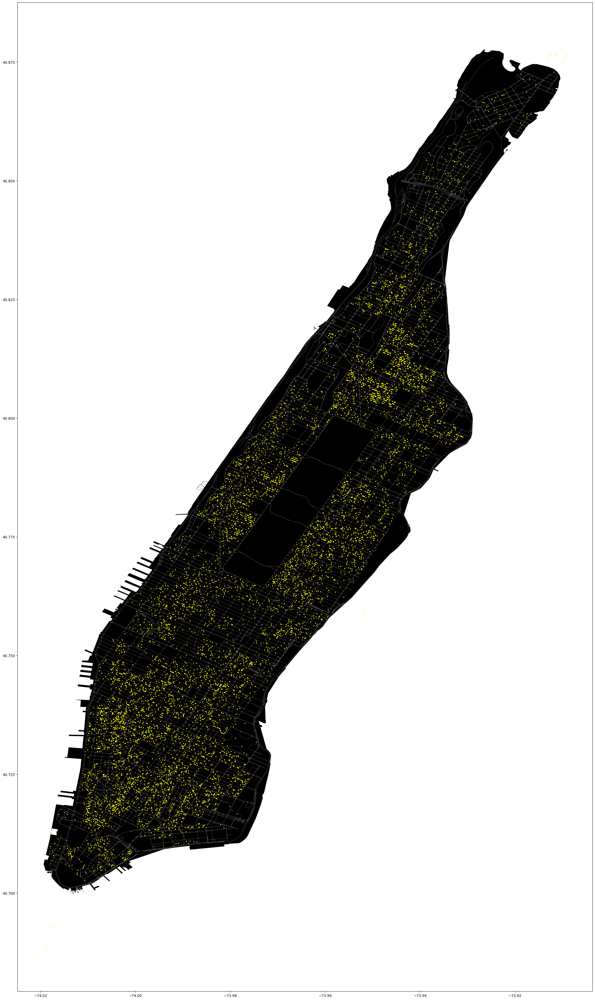

In [84]:
fig, ax = plt.subplots(figsize=(30,50),)
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'white', facecolor = 'black')
nodes.plot(ax= ax, color = 'white', markersize = .1)
construction_points.plot(ax= ax, markersize = 3, color = 'yellow')

In [25]:
close_edges = ox.distance.nearest_edges(G, construction_points['geometry'].x, construction_points['geometry'].y)
construction_count = Counter(close_edges)
new_construction = []

for i in edges.index:
    project = construction_count[edges.loc[i].name]
    new_construction.append(project)


edges['New Construction'] = new_construction

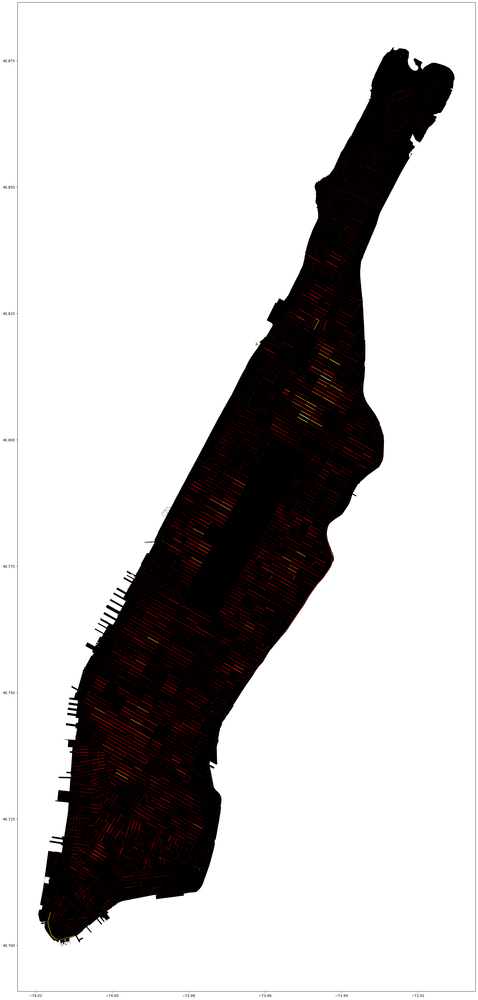

In [26]:
fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax, column = 'New Construction', cmap = 'hot', linewidth = 1.5)
nodes.plot(ax= ax, color = 'white', markersize = .1)
# property_gdf.plot(ax= ax,  markersize = 0.5, color = 'blue')

plt.show()

#### FEATURE ANALYSIS

In [27]:
import phik
from phik.report import plot_correlation_matrix
from phik import report
import seaborn as sns
import warnings

In [28]:
edges.head()

osmid               name  \
u        v        key                                                       
42421728 42435337 0                          195743153  Central Park West   
         42421731 0    [420625565, 420625573, 5668966]  West 106th Street   
         42432736 0           [1271523197, 1271523198]  Central Park West   
42421731 42437916 0                            5671485   Manhattan Avenue   
         42432737 0                          195743186   Manhattan Avenue   

                           highway maxspeed  oneway reversed   length  \
u        v        key                                                   
42421728 42435337 0      secondary   25 mph   False     True   85.345   
         42421731 0      secondary        0   False    False  138.033   
         42432736 0      secondary   25 mph   False    False   86.274   
42421731 42437916 0    residential        0   False     True   86.149   
         42432737 0    residential        0   False    False   85.968   

                                                                geometry  \
u        v        key                                                      
42421728 42435337 0    LINESTRING (-73.96004 40.79805, -73.96011 40.7...   
         42421731 0    LINESTRING (-73.96004 40.79805, -73.96017 40.7...   
         42432736 0    LINESTRING (-73.96004 40.79805, -73.95996 40.7...   
42421731 42437916 0    LINESTRING (-73.96147 40.79865, -73.96154 40.7...   
         42432737 0    LINESTRING (-73.96147 40.79865, -73.96140 40.7...   

                      lanes ref access bridge tunnel width junction  \
u        v        key                                                 
42421728 42435337 0       0   0      0      0      0     0        0   
         42421731 0       0   0      0      0      0     0        0   
         42432736 0       0   0      0      0      0     0        0   
42421731 42437916 0       0   0      0      0      0     0        0   
         42432737 0       0   0      0      0      0     0        0   

                       evictions  Average Value  Scaled Value  \
u        v        key                                           
42421728 42435337 0            0       0.000000     -0.194323   
         42421731 0            0  102010.825397     -0.190646   
         42432736 0            1       0.000000     -0.194323   
42421731 42437916 0            0   45066.893720     -0.192699   
         42432737 0            0       0.000000     -0.194323   

                       New Construction  
u        v        key                    
42421728 42435337 0                   0  
         42421731 0                   0  
         42432736 0                   0  
42421731 42437916 0                   3  
         42432737 0                   0

interval columns not set, guessing: ['Scaled Value', 'evictions', 'New Construction']


Text(0.5, 1.0, 'Correlation Heatmap')

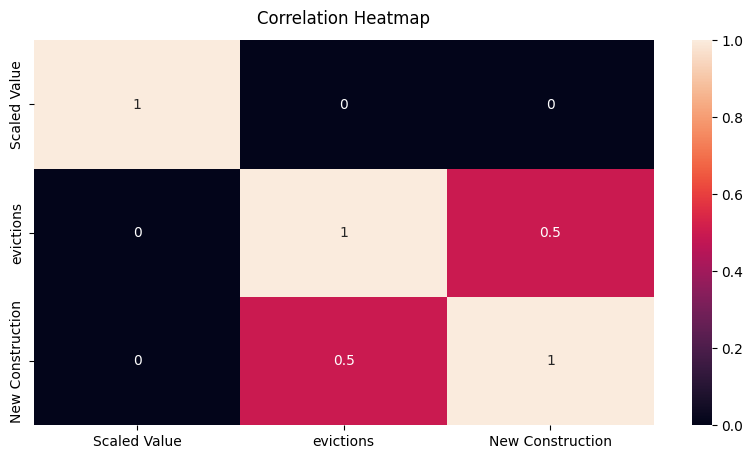

In [29]:
attributes_to_check = ['Scaled Value', 'evictions', 'New Construction']
data_to_check = edges[attributes_to_check]
warnings.filterwarnings("ignore")

plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(data_to_check.phik_matrix(), annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

#### ADD DATA TO NODES
Finds the average value of all connected edges for each node.

In [30]:
G_enriched = ox.graph_from_gdfs(nodes, edges)

In [31]:
edges.head()

osmid               name  \
u        v        key                                                       
42421728 42435337 0                          195743153  Central Park West   
         42421731 0    [420625565, 420625573, 5668966]  West 106th Street   
         42432736 0           [1271523197, 1271523198]  Central Park West   
42421731 42437916 0                            5671485   Manhattan Avenue   
         42432737 0                          195743186   Manhattan Avenue   

                           highway maxspeed  oneway reversed   length  \
u        v        key                                                   
42421728 42435337 0      secondary   25 mph   False     True   85.345   
         42421731 0      secondary        0   False    False  138.033   
         42432736 0      secondary   25 mph   False    False   86.274   
42421731 42437916 0    residential        0   False     True   86.149   
         42432737 0    residential        0   False    False   85.968   

                                                                geometry  \
u        v        key                                                      
42421728 42435337 0    LINESTRING (-73.96004 40.79805, -73.96011 40.7...   
         42421731 0    LINESTRING (-73.96004 40.79805, -73.96017 40.7...   
         42432736 0    LINESTRING (-73.96004 40.79805, -73.95996 40.7...   
42421731 42437916 0    LINESTRING (-73.96147 40.79865, -73.96154 40.7...   
         42432737 0    LINESTRING (-73.96147 40.79865, -73.96140 40.7...   

                      lanes ref access bridge tunnel width junction  \
u        v        key                                                 
42421728 42435337 0       0   0      0      0      0     0        0   
         42421731 0       0   0      0      0      0     0        0   
         42432736 0       0   0      0      0      0     0        0   
42421731 42437916 0       0   0      0      0      0     0        0   
         42432737 0       0   0      0      0      0     0        0   

                       evictions  Average Value  Scaled Value  \
u        v        key                                           
42421728 42435337 0            0       0.000000     -0.194323   
         42421731 0            0  102010.825397     -0.190646   
         42432736 0            1       0.000000     -0.194323   
42421731 42437916 0            0   45066.893720     -0.192699   
         42432737 0            0       0.000000     -0.194323   

                       New Construction  
u        v        key                    
42421728 42435337 0                   0  
         42421731 0                   0  
         42432736 0                   0  
42421731 42437916 0                   3  
         42432737 0                   0

In [32]:
for node in G_enriched.nodes():
    neighbors = list(G_enriched.neighbors(node))

    if len(neighbors) > 0:
    
        for neighbor in neighbors:

            neighbor_evictions=[]
            neighbor_value = []
            neighbor_construction = []

            neighbor_evictions.append(G_enriched.get_edge_data(node, neighbor)[0]['evictions'])
            neighbor_value.append(G_enriched.get_edge_data(node, neighbor)[0]['Average Value'])
            neighbor_value.append(G_enriched.get_edge_data(node, neighbor)[0]['New Construction'])

            length = len(neighbors)
            avg_evictions = sum(neighbor_evictions)
            avg_value = sum(neighbor_value)
            avg_construction = sum(neighbor_construction)

        G_enriched.nodes[node]['avg_evictions'] = avg_evictions
        G_enriched.nodes[node]['avg_value'] = avg_value
        G_enriched.nodes[node]['avg_construction'] = avg_construction

    else:
        G_enriched.nodes[node]['avg_evictions'] = 0
        G_enriched.nodes[node]['avg_value'] = 0
        G_enriched.nodes[node]['avg_construction'] = 0



In [33]:
nodes, edges = ox.graph_to_gdfs(G_enriched)
nodes['avg_evictions']

osmid
42421728       1
42435337       0
42421731       5
42432736       0
42437916       0
              ..
3786876211     0
10128931544    0
11868048948    0
11868048950    0
11942111842    0
Name: avg_evictions, Length: 4504, dtype: int64

#### SORT NODES BY NEIGHBORHOOD

In [34]:
from shapely.geometry import Point

neighborhood_data = open('./Data/Neighborhoods Boundries.geojson')
neighborhood_gdf = gpd.read_file(neighborhood_data)
neighborhood_gdf.to_crs(epsg = 4326)

manhatan_neighborhood_gdf = neighborhood_gdf[neighborhood_gdf['boroname'] == 'Manhattan']

In [35]:
unique_neighborhoods = manhatan_neighborhood_gdf['ntaname'].unique()
neighborhood_index = {neighborhood: idx for idx, neighborhood in enumerate(unique_neighborhoods)}

manhatan_neighborhood_gdf['neighborhood_index'] = manhatan_neighborhood_gdf['ntaname'].map(neighborhood_index)
manhatan_neighborhood_gdf.head()

,ntacode,shape_area,ntaname,shape_leng,boroname,borocode,countyfips,geometry,neighborhood_index
23,MN22,10895491.3668,East Village,13539.1976325,Manhattan,1,061,"MULTIPOLYGON (((-73.98256 40.73135, -73.98247 ...",0
26,MN32,13594779.7698,Yorkville,17409.2101147,Manhattan,1,061,"MULTIPOLYGON (((-73.93805 40.78083, -73.93790 ...",1
27,MN40,20065329.4877,Upper East Side-Carnegie Hill,23778.406402,Manhattan,1,061,"MULTIPOLYGON (((-73.94933 40.78519, -73.94982 ...",2
38,MN09,20158317.285,Morningside Heights,20744.3135549,Manhattan,1,061,"MULTIPOLYGON (((-73.95210 40.81144, -73.95259 ...",3
49,MN06,10647077.6941,Manhattanville,17040.6857307,Manhattan,1,061,"MULTIPOLYGON (((-73.94608 40.82126, -73.94640 ...",4


In [36]:
neighborhoods = []
for node, data in G_enriched.nodes(data=True):

    point = Point(data['x'], data['y'])

    for ind, shape in manhatan_neighborhood_gdf.iterrows():
        if shape['geometry'].contains(point):
            neighborhoods.append(shape['neighborhood_index'])

In [37]:
nodes['neighborhood'] = neighborhoods
nodes.head()

,y,x,highway,street_count,avg_evictions,avg_value,avg_construction,ref,geometry,neighborhood
osmid,,,,,,,,,,
42421728,40.798048,-73.960044,traffic_signals,3,1,0.000000e+00,0,NaN,POINT (-73.96004 40.79805),3
42435337,40.797376,-73.960535,traffic_signals,3,0,9.430400e+06,0,NaN,POINT (-73.96053 40.79738),23
42421731,40.798654,-73.961474,traffic_signals,4,5,2.299648e+05,0,NaN,POINT (-73.96147 40.79865),3
42432736,40.798726,-73.959547,traffic_signals,3,0,1.260381e+05,0,NaN,POINT (-73.95955 40.79873),3
42437916,40.797976,-73.961970,NaN,4,0,4.899987e+04,0,NaN,POINT (-73.96197 40.79798),23


<Axes: >

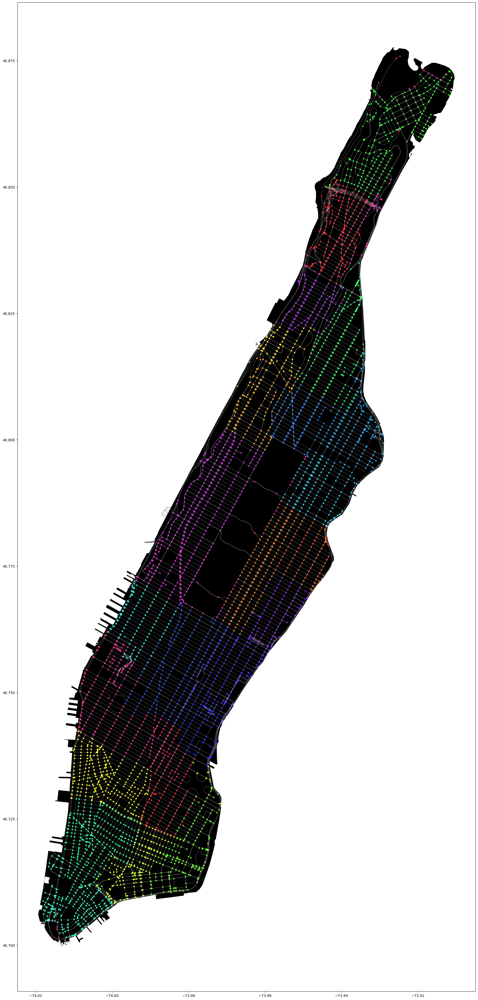

In [38]:
fig, ax = plt.subplots(figsize=(30,50))
area.plot(ax = ax, facecolor = 'black')
edges.plot(ax = ax,  linewidth = .3, color = 'white')
nodes.plot(ax= ax, column = 'neighborhood', cmap = 'hsv', markersize = 10)
# property_gdf.plot(ax= ax,  markersize = 0.5, color = 'blue')

### 3. ADD CLASSES
***

In [39]:
classes = []
for node in nodes['avg_evictions']:

    if node > 0 and node <= 5:
        classes.append(1)

    elif node > 5 and node <= 10:
        classes.append(2)
        
    elif node > 10 and node <= 15:
        classes.append(3)
    
    elif node > 15 and node <= 20:
        classes.append(4)
    
    elif node > 20:
        classes.append(5)
    else:
        classes.append(6)


nodes['class'] = classes
nodes.head()

,y,x,highway,street_count,avg_evictions,avg_value,avg_construction,ref,geometry,neighborhood,class
osmid,,,,,,,,,,,
42421728,40.798048,-73.960044,traffic_signals,3,1,0.000000e+00,0,NaN,POINT (-73.96004 40.79805),3,1
42435337,40.797376,-73.960535,traffic_signals,3,0,9.430400e+06,0,NaN,POINT (-73.96053 40.79738),23,6
42421731,40.798654,-73.961474,traffic_signals,4,5,2.299648e+05,0,NaN,POINT (-73.96147 40.79865),3,1
42432736,40.798726,-73.959547,traffic_signals,3,0,1.260381e+05,0,NaN,POINT (-73.95955 40.79873),3,6
42437916,40.797976,-73.961970,NaN,4,0,4.899987e+04,0,NaN,POINT (-73.96197 40.79798),23,6


### 4. SPLIT AND NORMALIZE

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [41]:
labeled_nodes = [i for i, j in zip(list(nodes.index), nodes['class']) if j != 6]
unlabeled_nodes = [i for i, j in zip(list(nodes.index), nodes['class']) if j == 6]

print(len(labeled_nodes))
print(len(unlabeled_nodes))

1432
3072


In [42]:
train_nodes, test_nodes = train_test_split(labeled_nodes, random_state= 1, test_size= .2)
train_nodes, validation_nodes = train_test_split(train_nodes, random_state= 1, test_size = .2)

prediction_nodes = unlabeled_nodes

print(len(train_nodes))
print(len(test_nodes))
print(len(validation_nodes))
print(len(prediction_nodes))

916
287
229
3072


In [43]:
nodes[['avg_evictions', 'avg_value', 'avg_construction']].loc[train_nodes]

,avg_evictions,avg_value,avg_construction
osmid,,,
2141026495,7,1.873375e+07,0
42453177,1,1.906650e+06,0
3430331121,4,9.369700e+06,0
42428332,2,4.308535e+06,0
42430378,4,2.975698e+06,0
...,...,...,...
42446171,5,6.011450e+06,0
42427483,8,7.335475e+05,0
42434992,3,5.552962e+05,0


In [44]:
scaler = StandardScaler()

train_features_std = scaler.fit_transform(nodes[['avg_evictions', 'avg_value', 'avg_construction']].loc[train_nodes])
validation_features_std = scaler.fit_transform(nodes[['avg_evictions', 'avg_value', 'avg_construction']].loc[validation_nodes])
test_features_std = scaler.fit_transform(nodes[['avg_evictions', 'avg_value', 'avg_construction']].loc[test_nodes])
prediction_features_std = scaler.fit_transform(nodes[['avg_evictions', 'avg_value', 'avg_construction']].loc[prediction_nodes])                                       

In [45]:
for ind, norm_train in zip (train_nodes, train_features_std):
    nodes.loc[ind, 'evictions_norm'] = norm_train[0]
    nodes.loc[ind, 'value_norm'] = norm_train[1]
    nodes.loc[ind, 'construction_norm'] = norm_train[2]


for ind, norm_validation in zip (validation_nodes, validation_features_std):
    nodes.loc[ind, 'evictions_norm'] = norm_validation[0]
    nodes.loc[ind, 'value_norm'] = norm_validation[1]
    nodes.loc[ind, 'construction_norm'] = norm_validation[2]


for ind, norm_test in zip (test_nodes, test_features_std):
    nodes.loc[ind, 'evictions_norm'] = norm_test[0]
    nodes.loc[ind, 'value_norm'] = norm_test[1]
    nodes.loc[ind, 'construction_norm'] = norm_test[2]


for ind, norm_prediction in zip (prediction_nodes, prediction_features_std):
    nodes.loc[ind, 'evictions_norm'] = norm_prediction[0]
    nodes.loc[ind, 'value_norm'] = norm_prediction[1]
    nodes.loc[ind, 'construction_norm'] = norm_prediction[2]

In [46]:
nodes

,y,x,highway,street_count,avg_evictions,avg_value,avg_construction,ref,geometry,neighborhood,class,evictions_norm,value_norm,construction_norm
osmid,,,,,,,,,,,,,,
42421728,40.798048,-73.960044,traffic_signals,3,1,0.000000e+00,0,NaN,POINT (-73.96004 40.79805),3,1,-0.472106,-0.325502,0.0
42435337,40.797376,-73.960535,traffic_signals,3,0,9.430400e+06,0,NaN,POINT (-73.96053 40.79738),23,6,0.000000,0.048385,0.0
42421731,40.798654,-73.961474,traffic_signals,4,5,2.299648e+05,0,NaN,POINT (-73.96147 40.79865),3,1,0.208113,-0.309842,0.0
42432736,40.798726,-73.959547,traffic_signals,3,0,1.260381e+05,0,NaN,POINT (-73.95955 40.79873),3,6,0.000000,-0.190273,0.0
42437916,40.797976,-73.961970,NaN,4,0,4.899987e+04,0,NaN,POINT (-73.96197 40.79798),23,6,0.000000,-0.192249,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3786876211,40.764906,-73.953189,NaN,1,0,0.000000e+00,0,NaN,POINT (-73.95319 40.76491),21,6,0.000000,-0.193506,0.0
10128931544,40.820384,-73.957906,NaN,1,0,0.000000e+00,0,NaN,POINT (-73.95791 40.82038),4,6,0.000000,-0.193506,0.0
11868048948,40.758976,-73.959252,NaN,1,0,1.000000e+00,0,NaN,POINT (-73.95925 40.75898),21,6,0.000000,-0.193506,0.0


### 5. CREATE DGL GRAPH
***

In [47]:
eviction_dic = {}
value_dic = {}
construction_dic = {}
neighborhood_dic = {}

classes_dic = {}
gdf_order_dic = {}

for i, j in enumerate(G_enriched.nodes()):
    eviction_dic[j] = nodes['evictions_norm'].iloc[i]
    value_dic[j] = nodes['value_norm'].iloc[i]
    construction_dic[j] = nodes['construction_norm'].iloc[i]
    neighborhood_dic = nodes['neighborhood'].iloc[i]

    classes_dic[j] = nodes['class'].iloc[i]
    gdf_order_dic[j] = i


nx.set_node_attributes(G_enriched,eviction_dic,'evictions_norm')
nx.set_node_attributes(G_enriched,value_dic,'value_norm')
nx.set_node_attributes(G_enriched,construction_dic,'construction_norm')
nx.set_node_attributes(G_enriched,neighborhood_dic,'neighborhood')
nx.set_node_attributes(G_enriched,gdf_order_dic,'gdf_order')

nx.set_node_attributes(G_enriched,classes_dic,'classes')

In [48]:
print(nx.get_node_attributes(G_enriched, "classes"))

{42421728: 1, 42435337: 6, 42421731: 1, 42432736: 6, 42437916: 6, 42432737: 1, 42421737: 6, 42437917: 1, 42421741: 1, 42432756: 1, 1061531654: 1, 42421745: 6, 42421749: 6, 11803957852: 1, 42421751: 6, 42431118: 2, 42432764: 6, 42421769: 6, 42443347: 6, 42421772: 1, 42442469: 1, 42421775: 6, 11655721345: 6, 42428653: 6, 42421776: 1, 42431024: 6, 42431019: 1, 42421778: 6, 42422592: 6, 42441587: 6, 42421783: 6, 42443522: 1, 42427782: 1, 42429174: 6, 8904913030: 6, 42421785: 2, 42421786: 1, 42443520: 1, 42421791: 1, 4814440062: 6, 42448930: 1, 42421800: 1, 42435308: 1, 42424851: 6, 42421803: 1, 42437300: 1, 42421806: 1, 42442475: 6, 42421809: 6, 11655721355: 6, 42428663: 6, 42421810: 6, 42431030: 6, 42431034: 6, 42421820: 6, 42437312: 6, 42441569: 6, 42421828: 1, 42430942: 1, 42430938: 6, 42421852: 1, 561035342: 2, 42442584: 6, 42438928: 2, 42421857: 1, 42421865: 6, 1506591534: 6, 42443181: 1, 1332860731: 6, 42421877: 6, 42421889: 1, 42437949: 6, 42432191: 6, 42430241: 1, 42421941: 6, 4242

In [49]:
nodes_attributes_list=["x", "y", "evictions_norm", "value_norm", "construction_norm", "neighborhood", "gdf_order", "classes"]
graph=dgl.from_networkx(G_enriched, node_attrs=nodes_attributes_list)

In [50]:
nodes_attributes_list[2:-2]

['evictions_norm', 'value_norm', 'construction_norm', 'neighborhood']

In [51]:
for i in nodes_attributes_list:
  graph.ndata[i]=torch.reshape(graph.ndata[i],(graph.ndata[i].shape[0],1))

graph.ndata["feat"]=torch.cat([graph.ndata[i] for i in nodes_attributes_list[2:-2]] ,1)
graph.ndata["feat"]=graph.ndata["feat"].type(torch.float32)

In [52]:
graph=dgl.add_reverse_edges(graph)

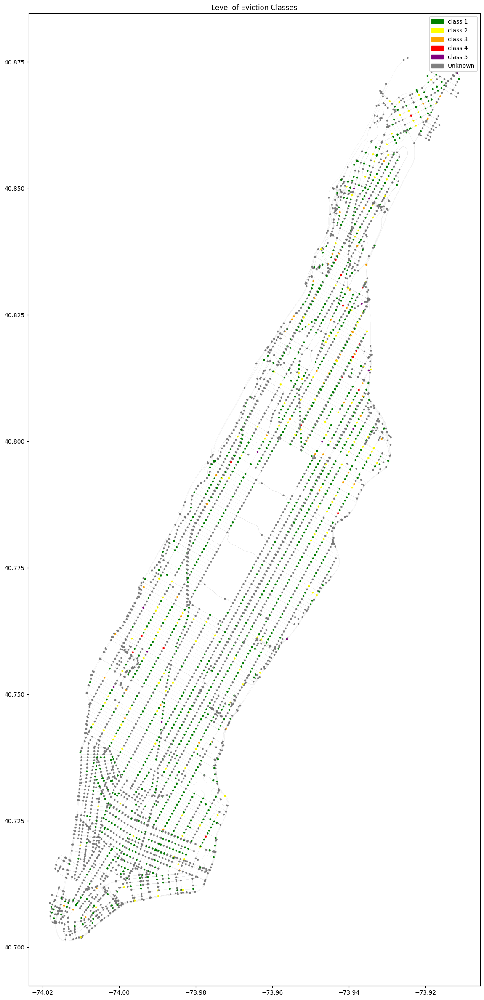

In [53]:
fig, ax = plt.subplots(figsize=(30,30))
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")
he_colors_dict={1:"green", 2:"yellow", 3:"orange", 4:"red", 5:"purple", 6:"gray"}
he_colors=[he_colors_dict[i] for i in nodes["class"] ]
nodes.plot( ax=ax, color=he_colors , markersize=5 , legend=True)
ax.set_title('Level of Eviction Classes')

#create a legend
c0 = mpatches.Patch(color=he_colors_dict[1], label='class 1')
c1 = mpatches.Patch(color=he_colors_dict[2], label='class 2')
c2 = mpatches.Patch(color=he_colors_dict[3], label='class 3')
c3 = mpatches.Patch(color=he_colors_dict[4], label='class 4')
c4 = mpatches.Patch(color=he_colors_dict[5], label='class 5')
c5 = mpatches.Patch(color=he_colors_dict[6], label='Unknown')

plt.legend(handles=[c0, c1, c2, c3, c4, c5] )

plt.show()

In [54]:
from sklearn.model_selection import train_test_split

labeled_nodes=[i.numpy().item() for i,j in zip(graph.nodes(),graph.ndata["classes"]) if j != 6]
un_labeled_nodes=[i.numpy().item() for i,j in zip(graph.nodes(),graph.ndata["classes"]) if j == 6]

print(len(labeled_nodes))
print(len(un_labeled_nodes))

1432
3072


In [55]:
train_nodes, test_nodes= train_test_split(labeled_nodes, random_state=1, test_size=.1) #test
train_nodes, validation_nodes= train_test_split(train_nodes, random_state=1, test_size=.11)      #validation

prediction_nodes=un_labeled_nodes

print(len(train_nodes))
print(len(test_nodes))
print(len(validation_nodes))
print(len(prediction_nodes))

1146
144
142
3072


In [56]:
print(sorted(train_nodes))
train_mask={i.numpy().item() :False for i in graph.nodes()}
print(train_mask)
[train_mask.update({n:True}) for n in train_nodes]
print(train_mask)

[0, 1, 10, 13, 14, 15, 16, 17, 18, 22, 23, 24, 27, 42, 76, 91, 104, 105, 117, 141, 146, 159, 160, 163, 166, 167, 169, 172, 174, 175, 177, 181, 191, 197, 201, 202, 207, 215, 217, 219, 221, 226, 229, 230, 232, 234, 235, 236, 237, 238, 239, 242, 246, 248, 252, 253, 254, 255, 256, 258, 259, 260, 261, 263, 266, 276, 279, 280, 282, 286, 289, 290, 305, 306, 309, 310, 317, 318, 321, 322, 323, 326, 329, 331, 338, 346, 350, 352, 353, 362, 363, 364, 365, 380, 381, 392, 411, 420, 423, 426, 430, 453, 454, 455, 459, 472, 474, 480, 487, 488, 495, 497, 499, 500, 503, 504, 505, 529, 530, 534, 536, 539, 548, 549, 552, 558, 564, 569, 574, 585, 587, 588, 603, 608, 609, 616, 621, 631, 633, 635, 636, 650, 654, 660, 662, 663, 671, 672, 674, 675, 676, 677, 681, 688, 690, 696, 702, 704, 706, 707, 710, 712, 725, 738, 747, 753, 767, 774, 776, 777, 778, 783, 784, 791, 797, 798, 800, 801, 802, 808, 809, 810, 814, 815, 824, 825, 826, 827, 829, 830, 831, 832, 833, 834, 842, 843, 844, 847, 859, 860, 863, 864, 865, 88

In [57]:
print(sorted(validation_nodes))
validation_mask={i.numpy().item() :False for i in graph.nodes()}
[validation_mask.update({n:True}) for n in validation_nodes]
print(validation_mask)

[3, 37, 65, 161, 257, 291, 302, 325, 337, 343, 344, 349, 413, 428, 438, 484, 489, 513, 537, 649, 670, 726, 769, 770, 799, 822, 828, 849, 855, 888, 897, 1005, 1070, 1075, 1128, 1143, 1150, 1184, 1192, 1244, 1263, 1282, 1285, 1297, 1313, 1358, 1390, 1412, 1414, 1483, 1490, 1529, 1542, 1547, 1609, 1613, 1616, 1631, 1683, 1689, 1732, 1733, 1758, 1799, 1829, 1873, 1917, 1923, 1945, 1964, 1966, 1971, 1976, 1998, 2019, 2023, 2034, 2105, 2113, 2204, 2208, 2211, 2212, 2237, 2244, 2249, 2263, 2279, 2289, 2348, 2366, 2402, 2420, 2514, 2551, 2557, 2563, 2564, 2599, 2626, 2634, 2680, 2687, 2715, 2752, 2789, 2798, 2802, 2828, 2834, 2872, 3019, 3285, 3384, 3424, 3441, 3519, 3668, 3675, 3695, 3715, 3838, 3852, 3855, 3868, 3884, 3900, 3906, 3958, 3962, 3965, 4034, 4082, 4103, 4109, 4154, 4157, 4255, 4272, 4345, 4369, 4431]
{0: False, 1: False, 2: False, 3: True, 4: False, 5: False, 6: False, 7: False, 8: False, 9: False, 10: False, 11: False, 12: False, 13: False, 14: False, 15: False, 16: False, 17: F

In [58]:
print(sorted(test_nodes))
test_mask={i.numpy().item() :False for i in graph.nodes()}
[test_mask.update({n:True}) for n in test_nodes]
print(test_mask)

[8, 87, 180, 222, 223, 241, 285, 307, 313, 335, 341, 348, 351, 612, 620, 651, 683, 701, 744, 862, 901, 909, 942, 943, 991, 998, 1009, 1042, 1077, 1139, 1151, 1153, 1225, 1232, 1257, 1268, 1292, 1322, 1353, 1375, 1386, 1395, 1460, 1509, 1515, 1541, 1556, 1557, 1588, 1623, 1666, 1673, 1697, 1718, 1849, 1856, 1868, 1877, 1891, 1946, 1970, 1979, 2033, 2091, 2136, 2141, 2221, 2252, 2264, 2278, 2291, 2328, 2336, 2340, 2393, 2412, 2429, 2434, 2447, 2509, 2511, 2515, 2517, 2550, 2554, 2566, 2573, 2594, 2607, 2661, 2665, 2666, 2704, 2787, 2788, 2790, 2793, 2820, 2850, 2874, 2890, 2893, 2897, 2899, 2908, 2922, 2970, 2989, 3003, 3015, 3027, 3028, 3046, 3062, 3075, 3077, 3091, 3179, 3260, 3290, 3404, 3421, 3435, 3516, 3530, 3547, 3600, 3624, 3783, 3806, 3820, 3829, 3892, 3902, 3974, 4006, 4175, 4204, 4225, 4250, 4276, 4289, 4383, 4476]
{0: False, 1: False, 2: False, 3: False, 4: False, 5: False, 6: False, 7: False, 8: True, 9: False, 10: False, 11: False, 12: False, 13: False, 14: False, 15: False

In [59]:
print(sorted(prediction_nodes))
prediction_mask={i.numpy().item() :False for i in graph.nodes()}
[prediction_mask.update({n:True}) for n in prediction_nodes]
print(prediction_mask)

[2, 4, 5, 6, 7, 9, 11, 12, 19, 20, 21, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 145, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 162, 164, 165, 168, 170, 171, 173, 176, 178, 179, 182, 183, 184, 185, 186, 187, 188, 189, 190, 192, 193, 194, 195, 196, 198, 199, 200, 203, 204, 205, 206, 208, 209, 210, 211, 212, 213, 214, 216, 218, 220, 224, 225, 227, 228, 231, 233, 240, 243, 244, 245, 247, 249, 250, 251, 262, 264, 265, 267, 268, 269, 270, 271, 272, 273, 274, 275, 277, 278, 281, 283, 284, 287, 288, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301,

In [60]:
reorder_dict={}
for i,j in enumerate([o.numpy().item() for o in graph.ndata["gdf_order"]]):
  reorder_dict[j]=i
print(reorder_dict)

{0: 0, 2: 1, 6: 2, 8: 3, 11: 4, 12: 5, 14: 6, 17: 7, 19: 8, 21: 9, 24: 10, 27: 11, 30: 12, 35: 13, 36: 14, 38: 15, 41: 16, 44: 17, 46: 18, 48: 19, 51: 20, 54: 21, 57: 22, 60: 23, 64: 24, 65: 25, 69: 26, 70: 27, 74: 28, 77: 29, 78: 30, 75: 31, 80: 32, 84: 33, 86: 34, 89: 35, 91: 36, 94: 37, 98: 38, 99: 39, 102: 40, 106: 41, 107: 42, 109: 43, 114: 44, 118: 45, 120: 46, 122: 47, 123: 48, 125: 49, 129: 50, 130: 51, 132: 52, 134: 53, 136: 54, 139: 55, 144: 56, 146: 57, 147: 58, 28: 59, 151: 60, 154: 61, 158: 62, 160: 63, 163: 64, 164: 65, 168: 66, 171: 67, 173: 68, 172: 69, 178: 70, 181: 71, 183: 72, 185: 73, 187: 74, 188: 75, 190: 76, 191: 77, 196: 78, 199: 79, 203: 80, 206: 81, 208: 82, 210: 83, 209: 84, 213: 85, 216: 86, 219: 87, 223: 88, 227: 89, 229: 90, 231: 91, 232: 92, 235: 93, 238: 94, 242: 95, 245: 96, 247: 97, 249: 98, 251: 99, 246: 100, 256: 101, 261: 102, 264: 103, 265: 104, 248: 105, 270: 106, 271: 107, 274: 108, 275: 109, 279: 110, 281: 111, 283: 112, 285: 113, 287: 114, 290:

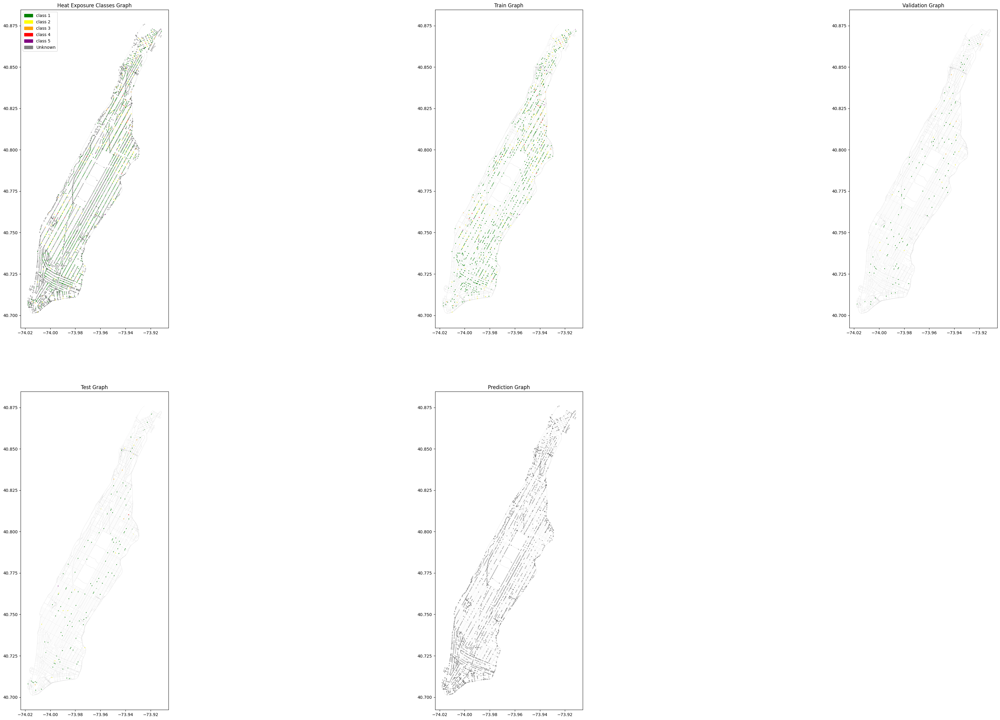

In [87]:
fig = plt.figure(figsize=(50,30))
he_colors_dict={1:"green", 2:"yellow", 3:"orange", 4:"red", 5:"purple", 6:"gray"}
classes_list=[t[0] for t in graph.ndata["classes"].tolist()]
classes_list_reordered=[classes_list[reorder_dict[i]] for i in sorted(reorder_dict.keys())]

out_of_mask_color="white"

# Graph
ax = fig.add_subplot(2,3,1)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")
he_colors=[he_colors_dict[i] for i in nodes["class"]]
nodes.plot(ax=ax, color=he_colors , markersize=0.6 , legend=True)
ax.set_title('Heat Exposure Classes Graph')

c0 = mpatches.Patch(color=he_colors_dict[1], label='class 1')
c1 = mpatches.Patch(color=he_colors_dict[2], label='class 2')
c2 = mpatches.Patch(color=he_colors_dict[3], label='class 3')
c3 = mpatches.Patch(color=he_colors_dict[4], label='class 4')
c4 = mpatches.Patch(color=he_colors_dict[5], label='class 5')
c5 = mpatches.Patch(color=he_colors_dict[6], label='Unknown')

plt.legend(handles=[c0, c1, c2, c3, c4, c5] )

#Train mask
ax = fig.add_subplot(2,3,2)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")

train_colors=[he_colors_dict[j] if train_mask[reorder_dict[i]]==True else out_of_mask_color for i,j in enumerate(classes_list_reordered) ] #dont use nodes["classes"] since the nodes order changed in dgl graph
nodes.plot(ax=ax, color=train_colors , markersize=0.6 , legend=True)
ax.set_title('Train Graph')

#Validation mask
ax = fig.add_subplot(2,3,3)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")

validation_colors=[he_colors_dict[j] if validation_mask[reorder_dict[i]]==True else out_of_mask_color for i,j in enumerate(classes_list_reordered) ]
nodes.plot(ax=ax, color=validation_colors , markersize=0.6 , legend=True)
ax.set_title('Validation Graph')

#Test mask
ax = fig.add_subplot(2,3,4)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")

test_colors=[he_colors_dict[j] if test_mask[reorder_dict[i]]==True else out_of_mask_color for i,j in enumerate(classes_list_reordered) ]
nodes.plot(ax=ax, color=test_colors , markersize=0.6 , legend=True)
ax.set_title('Test Graph')

#prediction mask
ax = fig.add_subplot(2,3,5)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")

prediction_colors=[he_colors_dict[j] if prediction_mask[reorder_dict[i]]==True else out_of_mask_color for i,j in enumerate(classes_list_reordered) ]
nodes.plot(ax=ax, color=prediction_colors , markersize=0.6 , legend=True)
ax.set_title('Prediction Graph')

plt.show()

In [88]:
graph.ndata["train_mask"]=torch.tensor(list(train_mask.values()))
graph.ndata["validation_mask"]=torch.tensor(list(validation_mask.values()))
graph.ndata["test_mask"]=torch.tensor(list(test_mask.values()))
graph.ndata["prediction_mask"]=torch.tensor(list(prediction_mask.values()))

In [89]:
class SAGE(nn.Module):
    def __init__(self, in_feats, hid_feats, out_feats):
        super().__init__()
        self.conv1 = SAGEConv(in_feats=in_feats, out_feats=hid_feats, aggregator_type='mean')
        self.conv2 = SAGEConv(in_feats=hid_feats, out_feats=out_feats, aggregator_type='mean')

    def forward(self, graph, inputs):
        # inputs are features of nodes
        h = self.conv1(graph, inputs)
        h = F.relu(h)
        h = self.conv2(graph, h)
        return h

In [90]:
n_features=graph.ndata["feat"].shape[1]
classes_list=[t[0] for t in graph.ndata["classes"].tolist()]
n_labels=len(Counter(classes_list).keys())

In [92]:
n_hidden=16
lr=0.03
n_epochs=200
device='cuda'

In [93]:
model = SAGE(in_feats=n_features, hid_feats=n_hidden, out_feats=n_labels)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
model_path="best_model"
torch.manual_seed(710)
best_val_acc = 0
best_test_acc = 0

features = graph.ndata['feat']
labels = graph.ndata['classes']
train_mask_1 = graph.ndata['train_mask']
val_mask_1 = graph.ndata['validation_mask']
test_mask_1 = graph.ndata['test_mask']

train_accs=[]
valid_accs=[]

for e in range(n_epochs):
    # Forward
    logits = model(graph, features)

    # Compute prediction
    pred = logits.argmax(1)

    # Compute loss
    # Note that you should only compute the losses of the nodes in the training set.
    loss = F.cross_entropy(logits[train_mask_1], labels[train_mask_1].squeeze())

    # Compute accuracy on training/validation/test
    train_acc = (pred[train_mask_1] == labels[train_mask_1]).float().mean()
    val_acc = (pred[val_mask_1] == labels[val_mask_1]).float().mean()
    # test_acc = (pred[test_mask_1] == labels[test_mask_1]).float().mean()

    train_accs.append(train_acc)
    valid_accs.append(val_acc)

    # Save the best validation accuracy and the corresponding test accuracy.
    if best_val_acc < val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), model_path)

    # Backward
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print('In epoch {}, loss: {:.3f}, train acc: {:.3f}, val acc: {:.3f}'.format(e, loss, train_acc, val_acc))

In epoch 0, loss: 4.249, train acc: 0.096, val acc: 0.061
In epoch 1, loss: 2.744, train acc: 0.812, val acc: 0.866
In epoch 2, loss: 2.128, train acc: 0.812, val acc: 0.866
In epoch 3, loss: 4.494, train acc: 0.121, val acc: 0.104
In epoch 4, loss: 2.270, train acc: 0.795, val acc: 0.866
In epoch 5, loss: 3.051, train acc: 0.810, val acc: 0.866
In epoch 6, loss: 3.658, train acc: 0.811, val acc: 0.866
In epoch 7, loss: 3.882, train acc: 0.811, val acc: 0.866
In epoch 8, loss: 3.782, train acc: 0.810, val acc: 0.866
In epoch 9, loss: 3.401, train acc: 0.810, val acc: 0.866
In epoch 10, loss: 2.794, train acc: 0.809, val acc: 0.866
In epoch 11, loss: 2.033, train acc: 0.800, val acc: 0.866
In epoch 12, loss: 1.365, train acc: 0.748, val acc: 0.831
In epoch 13, loss: 1.821, train acc: 0.252, val acc: 0.240
In epoch 14, loss: 1.910, train acc: 0.124, val acc: 0.104
In epoch 15, loss: 1.139, train acc: 0.724, val acc: 0.800
In epoch 16, loss: 1.318, train acc: 0.762, val acc: 0.830
In epoc

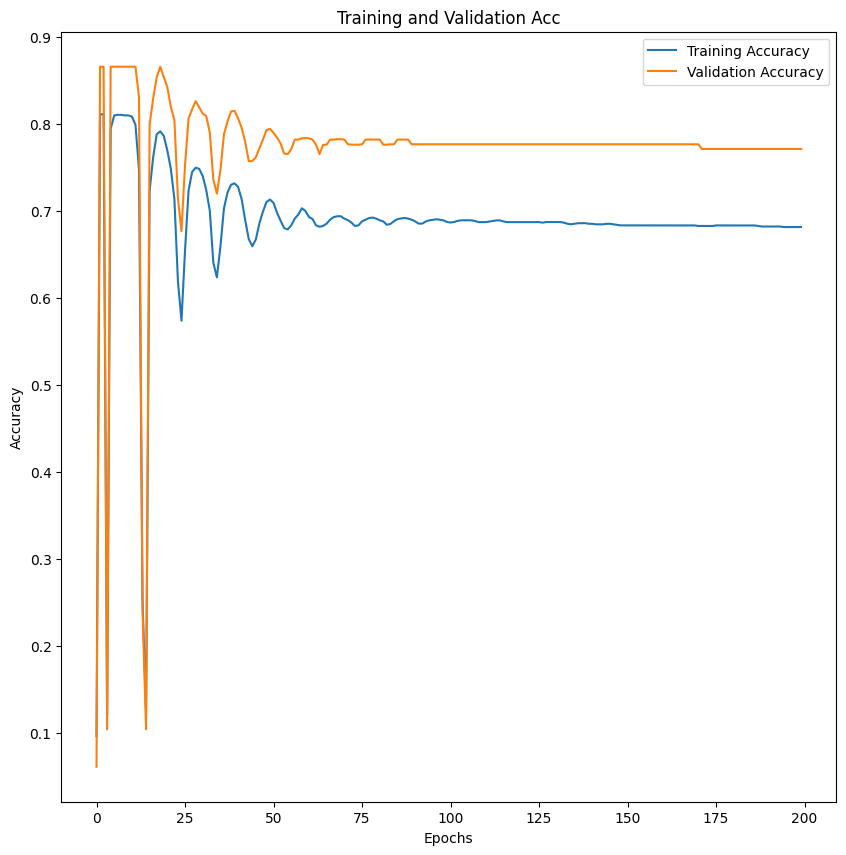

In [94]:
%matplotlib inline
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1)

plt.plot(range(n_epochs), [a.numpy().item() for a in train_accs], label='Training Accuracy')
plt.plot(range(n_epochs), [a.numpy().item() for a in valid_accs], label='Validation Accuracy')

# Add in a title and axes labels
plt.title('Training and Validation Acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Display the plot
plt.legend(loc='best')
plt.show()

In [ ]:
reorder_dict={}
for i,j in enumerate([o.numpy().item() for o in graph.ndata["gdf_order"]]):
  reorder_dict[j]=i
print(reorder_dict)

{0: 0, 2: 1, 6: 2, 8: 3, 11: 4, 12: 5, 14: 6, 17: 7, 19: 8, 21: 9, 24: 10, 27: 11, 30: 12, 35: 13, 36: 14, 38: 15, 41: 16, 44: 17, 46: 18, 48: 19, 51: 20, 54: 21, 57: 22, 60: 23, 64: 24, 65: 25, 69: 26, 70: 27, 74: 28, 77: 29, 78: 30, 75: 31, 80: 32, 84: 33, 86: 34, 89: 35, 91: 36, 94: 37, 98: 38, 99: 39, 102: 40, 106: 41, 107: 42, 109: 43, 114: 44, 118: 45, 120: 46, 122: 47, 123: 48, 125: 49, 129: 50, 130: 51, 132: 52, 134: 53, 136: 54, 139: 55, 144: 56, 146: 57, 147: 58, 28: 59, 151: 60, 154: 61, 158: 62, 160: 63, 163: 64, 164: 65, 168: 66, 171: 67, 173: 68, 172: 69, 178: 70, 181: 71, 183: 72, 185: 73, 187: 74, 188: 75, 190: 76, 191: 77, 196: 78, 199: 79, 203: 80, 206: 81, 208: 82, 210: 83, 209: 84, 213: 85, 216: 86, 219: 87, 223: 88, 227: 89, 229: 90, 231: 91, 232: 92, 235: 93, 238: 94, 242: 95, 245: 96, 247: 97, 249: 98, 251: 99, 246: 100, 256: 101, 261: 102, 264: 103, 265: 104, 248: 105, 270: 106, 271: 107, 274: 108, 275: 109, 279: 110, 281: 111, 283: 112, 285: 113, 287: 114, 290:

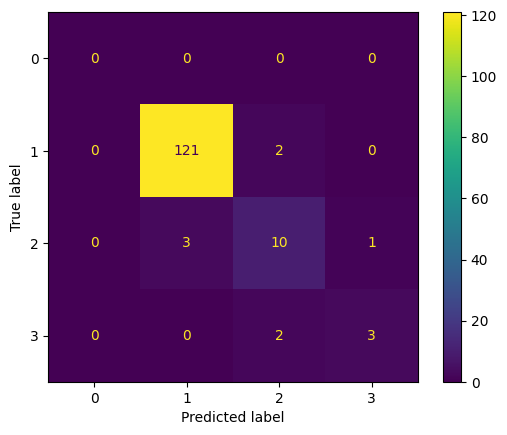

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_test= labels[test_mask_1]
predictions = pred[test_mask_1]
cm = confusion_matrix(y_test, predictions, labels=[0,1,2,3])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[0,1,2,3])
disp.plot()
plt.show()

In [85]:
Counter([t[0] for t in graph.ndata["classes"].tolist()])

Counter({1: 1176, 6: 3072, 2: 166, 4: 17, 3: 60, 5: 13})

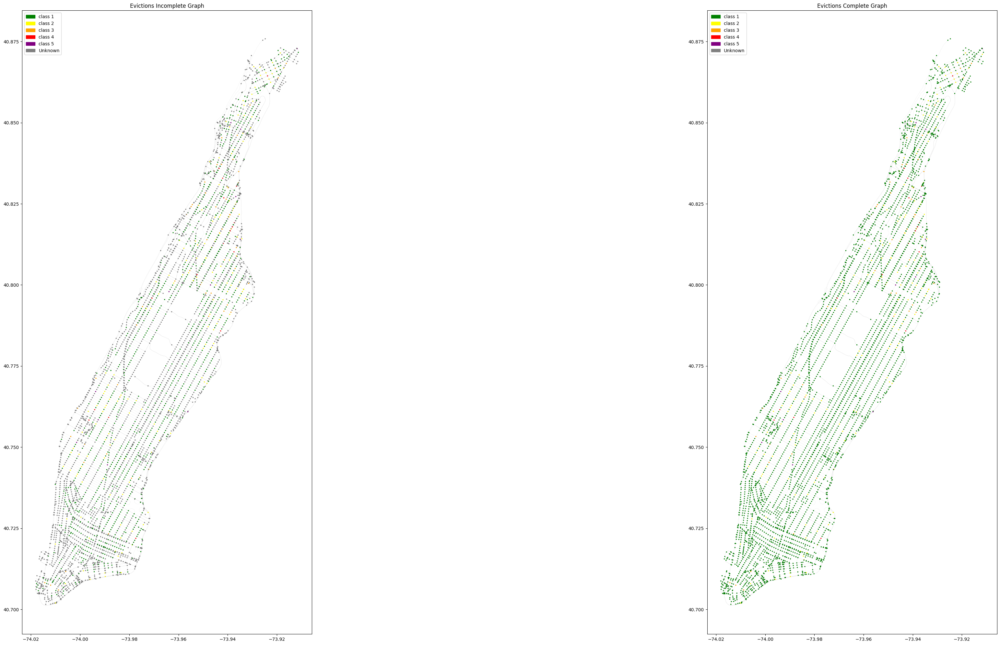

In [96]:
fig = plt.figure(figsize=(50,25))
he_colors_dict={1:"green", 2:"yellow", 3:"orange", 4:"red", 5:"purple", 6:"gray"}
g_nodes=[n.numpy().item() for n in graph.nodes()]

#in osmnx order for visualization
classes_list=[t[0] for t in graph.ndata["classes"].tolist()]
classes_list_reordered=[classes_list[reorder_dict[i]] for i in sorted(reorder_dict.keys())]

classes_predicted_list=[i.numpy().item() for i in pred]
classes_predicted_list_reordered=[classes_predicted_list[reorder_dict[i]] for i in sorted(reorder_dict.keys())]

out_of_mask_color="white"

# Graph
ax = fig.add_subplot(1,2,1)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")
he_colors=[he_colors_dict[i] for i in classes_list_reordered]
nodes.plot(ax=ax, color=he_colors , markersize=2 , legend=True)
ax.set_title('Evictions Incomplete Graph')

c0 = mpatches.Patch(color=he_colors_dict[1], label='class 1')
c1 = mpatches.Patch(color=he_colors_dict[2], label='class 2')
c2 = mpatches.Patch(color=he_colors_dict[3], label='class 3')
c3 = mpatches.Patch(color=he_colors_dict[4], label='class 4')
c4 = mpatches.Patch(color=he_colors_dict[5], label='class 5')
c5 = mpatches.Patch(color=he_colors_dict[6], label='Unknown')

plt.legend(handles=[c0, c1, c2, c3, c4, c5] )


#prediction mask
ax = fig.add_subplot(1,2,2)
edges.plot(ax=ax, linewidth=0.03, edgecolor="black")

#notice it is not prediction_mask[i], but prediction_mask[reorder_dict[i]].. always pay attention to the data structre
prediction_colors=[he_colors_dict[j] if prediction_mask[reorder_dict[i]]==True else he_colors_dict[k] for i,(j,k) in enumerate(zip(classes_predicted_list_reordered,classes_list_reordered))] #j predicte class that we don't know, k is real class that we already know
nodes.plot(ax=ax, color=prediction_colors , markersize=2 , legend=True)
ax.set_title('Evictions Complete Graph')

c0 = mpatches.Patch(color=he_colors_dict[1], label='class 1')
c1 = mpatches.Patch(color=he_colors_dict[2], label='class 2')
c2 = mpatches.Patch(color=he_colors_dict[3], label='class 3')
c3 = mpatches.Patch(color=he_colors_dict[4], label='class 4')
c4 = mpatches.Patch(color=he_colors_dict[5], label='class 5')
c5 = mpatches.Patch(color=he_colors_dict[6], label='Unknown')

plt.legend(handles=[c0, c1, c2, c3, c4, c5] )
plt.show()